# Problem Identification

# Problem Identification

Analisis sentimen terhadap layanan internet satelit Starlink yang dimiliki oleh Elon Musk menjadi penting untuk memahami opini publik terkait beberapa aspek utama, yaitu layanan, kecepatan, dan harga.

Tujuan dari proyek ini adalah:
1. Menggunakan metode Support Vector Machine (SVM) untuk mengklasifikasikan sentimen review Starlink.
2. Mengukur akurasi model SVM dalam mengklasifikasikan sentimen berdasarkan tiga aspek utama:
   - Layanan (Service)
   - Kecepatan (Speed)
   - Harga (Price)
3. Membandingkan hasil akurasi model pada masing-masing aspek untuk mengetahui aspek mana yang memiliki
   prediksi paling akurat.
4. Memberikan insight terkait sentimen publik terhadap Starlink berdasarkan hasil klasifikasi.

Metodologi:
- Dataset yang digunakan berisi review pengguna Starlink yang telah dikategorikan berdasarkan aspek layanan,
  kecepatan, dan harga.
- Proses klasifikasi dilakukan menggunakan metode Support Vector Machine (SVM) dengan pendekatan supervised learning.
- Model akan dievaluasi menggunakan metrik akurasi untuk menilai sejauh mana SVM dapat mengklasifikasikan sentimen
  dengan benar pada masing-masing aspek.

Output:
- Grafik perbandingan akurasi model berdasarkan aspek layanan, kecepatan, dan harga.
- Kesimpulan mengenai performa SVM dalam menganalisis sentimen terkait Starlink.


## Library Inisiation

In [1]:
!pip install Sastrawi
!pip install simplemma

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.2/67.2 MB 8.1 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import re
import simplemma
from IPython.core.display import display, HTML
from sklearn import svm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
warnings.filterwarnings('ignore')


# Data Preparation

In [3]:
def display_with_scroll(df, height='400px'):
    """Menampilkan dataframe dengan scrollbar dan nomor baris."""
    style = f"""
    <style>
        .dataframe-div {{
            max-height: {height};
            overflow-y: auto;
            border: 1px solid black;
            padding: 10px;
        }}
    </style>
    """
    display(HTML(style + f"""
    <div class='dataframe-div'>
        {df.to_html(index=True)}
    </div>
    """))

In [4]:
df = pd.read_excel('/content/Review Starlink.xlsx')
# Tampilkan dataset dengan scrollbar
print("Dataset Review Starlink David Gadgetin")
display_with_scroll(df, height='600px')

Dataset Review Starlink David Gadgetin


,text,layanan,kecepatan,harga
0,Starlink harus di tarik Pajak lebih tinggi apapun yg terjadi dan alasan secanggih apapun juga Tak perduli . Negara kan harus suruh bikin pabrik alih teknologi di Indonesia kalau tak mau ya apa sikap presiden ;;,-1,0,0
1,Dilarang atau pajak tinggi. atau dirikan pabrik Alih teknologi banyak tenaga kerja otak brilian masih nganggur. Nagara harus punya ketegasan yg kongrit. Okee ;;,-1,0,0
2,Ini bagus banget si buat kita orang desa pedalaman yang gada jaringan,1,0,0
3,Kalo di pakai di bangunan yang memiliki 3 tingkat dan memiliki 3 lapis ketebalan beton ±40 cm apakah di posisi paling bawah mendapatkan sinyal yang cukup atau sama seperti router wifi lainnya yang sedikit susah menembus tembok atau beton,0,0,0
4,Selamat tinggal ubiqu… selama bikin kantong jebol...1 GB 100 ribu itupun bertahan 3 hari paling lama...hanya WA aja,0,0,-1
5,perangkat beli sendiri dan kalau rusak service kemana 😂😂😂😂.... after seles nya kasih perbandingan jugalah 😂😂😂 hati - hati kesambar petir langsung ambyar tuh perangkat😂😂😂 gk boleh sharing sama aja mahal jatuhnya 😂😂😂,-1,0,-1
6,Nah mantab nih dibawa ke tambang. Btw tambang di indonesia mayoritas open pit jadi terbuka. Hanya beberapa tambang aja yg underground.,1,0,0
7,Tamparan keras utk yg suka jual mahal dan merasa raja lokal telekomunikasi tapi pelayanannya pas- pas an,-1,0,0
8,nonton video gadgetin ini pakai starlink ditengah hutan sulawesi dengan kualitas 4K lancar sekali...,0,1,0
9,harga 2024 itu 6 jt ++ dan masalahnya bulanan 750 rb per bulan 😂😂,0,0,-1


In [5]:
kamus_alay = pd.read_csv('/content/kamus_alay.csv', encoding='latin-1')
# Membuat kamus alay (kata alay -> kata normal)
kamus_alay_dict = dict(zip(kamus_alay['kata_alay'], kamus_alay['kata_normal']))

# Exploratory Data Analysis ( EDA )

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       399 non-null    object
 1   layanan    399 non-null    int64 
 2   kecepatan  399 non-null    int64 
 3   harga      399 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 12.6+ KB


In [7]:
df['layanan'].value_counts()

,count
layanan,
0,196
1,163
-1,40


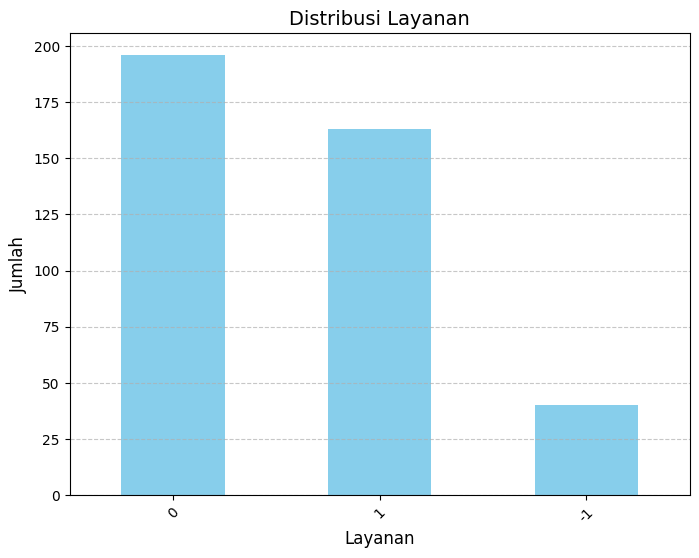

In [8]:
# Visualisasi
plt.figure(figsize=(8, 6))
# Assign the result of value_counts() to a variable
value_counts = df['layanan'].value_counts()
value_counts.plot(kind='bar', color='skyblue')
plt.title('Distribusi Layanan', fontsize=14)
plt.xlabel('Layanan', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [9]:
df['kecepatan'].value_counts()

,count
kecepatan,
0,355
1,28
-1,16


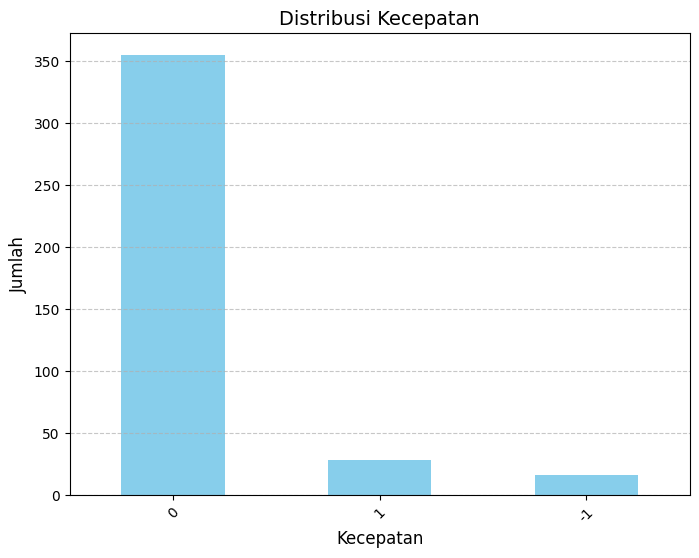

In [10]:
# Visualisasi
plt.figure(figsize=(8, 6))
# Assign the result of value_counts() to a variable
value_counts = df['kecepatan'].value_counts()
value_counts.plot(kind='bar', color='skyblue')
plt.title('Distribusi Kecepatan', fontsize=14)
plt.xlabel('Kecepatan', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [11]:
df['harga'].value_counts()

,count
harga,
0,240
-1,99
1,60


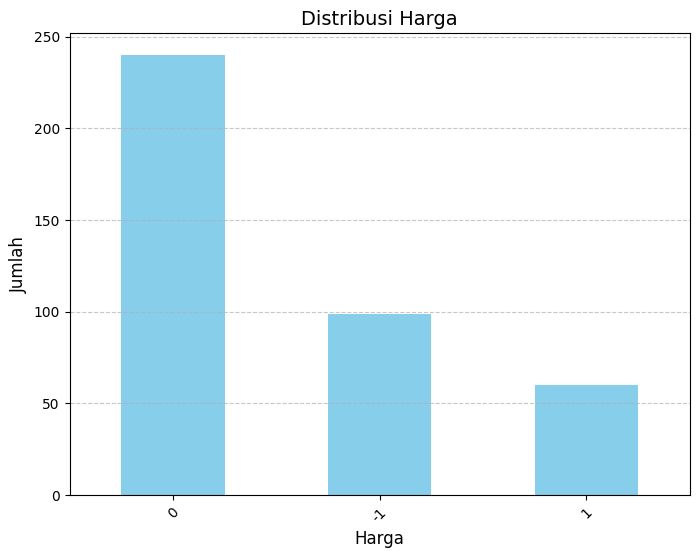

In [12]:
# Visualisasi
plt.figure(figsize=(8, 6))
# Assign the result of value_counts() to a variable
value_counts = df['harga'].value_counts()
value_counts.plot(kind='bar', color='skyblue')
plt.title('Distribusi Harga', fontsize=14)
plt.xlabel('Harga', fontsize=12)
plt.ylabel('Jumlah', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Preprocessing
Data mentah dibersihkan dengan rangkaian langkah sebagai berikut:
1. Word Normalization
2. Transform Negation
3. Case Folding
4. Remove Mention
5. Filltering
6. Lemmatization
7. Tokenize

In [13]:
# Lemmatization: Mengubah kata menjadi bentuk dasar
def lemmatization(text):
    text = ' '.join(simplemma.lemmatize(word, lang='id') for word in text.split() if word in text)
    return text

# Case Folding: Mengubah teks menjadi huruf kecil
def case_folding(text):
    """Mengubah teks menjadi huruf kecil."""
    return text.lower()

# Remove : Menghapus mention
def remove_mentions(text):
    return re.sub(r'@\w+', '', text).strip()

# Filtering: Menghapus karakter selain huruf dan angka
def filtering(text):
    """Menghapus karakter selain huruf, angka dan underscore."""
    return re.sub(r'[^a-zA-Z0-9\s_]', '', text)

# Normalisasi Kata (menggunakan kamus alay)
def word_normalization(text, kamus_alay):
    """Normalisasi kata berdasarkan kamus alay."""
    words = text.split()
    normalized_words = [kamus_alay.get(word, word) for word in words]
    return ' '.join(normalized_words)

# Konversi Negasi: Menggabungkan kata negasi dengan kata setelahnya menggunakan '_'
def transform_negation(text):
    pattern = r"\b(tidak|bukan|jangan|enggak|tanpa)\s+(\w+)"
    matches = re.findall(pattern, text)
    print(f"Pola ditemukan: {matches}")  # Debug
    transformed_text = re.sub(pattern, lambda match: f"{match.group(1)}_{match.group(2)}", text)
    print(f"Setelah transform_negation: {transformed_text}")  # Debug
    return transformed_text

# Tokenisasi: Memecah teks menjadi token
def tokenization(text):
    """Memecah teks menjadi token."""
    return text.split()

In [14]:
def text_preprocessing(text, kamus_alay_dict):

    # Normalisasi kata
    text = word_normalization(text, kamus_alay_dict)

    # Konversi negasi
    text = transform_negation(text)

    # Case folding
    text = case_folding(text)

    # Remove mention
    text = remove_mentions(text)

    # Filtering
    text = filtering(text)

    # Lemma
    text = lemmatization(text)

    # Tokenisasi
    text = tokenization(text)

    return text


In [15]:
df['text_preprocessing'] = df['text'].apply(lambda x: text_preprocessing(x, kamus_alay_dict))

Pola ditemukan: []
Setelah transform_negation: Starlink harus di tarik Pajak lebih tinggi apapun yang terjadi dan alasan secanggih apapun juga Tak perduli . Negara kan harus suruh bikin pabrik alih teknologi di Indonesia kalau tak mau ya apa sikap presiden ;;
Pola ditemukan: []
Setelah transform_negation: Dilarang atau pajak tinggi. atau dirikan pabrik Alih teknologi banyak tenaga kerja otak brilian masih nganggur. Nagara harus punya ketegasan yang kongrit. Okee ;;
Pola ditemukan: [('enggak', 'ada')]
Setelah transform_negation: Ini bagus sekali sih buat kita orang desa pedalaman yang enggak_ada jaringan
Pola ditemukan: []
Setelah transform_negation: Kalo di pakai di bangunan yang memiliki 3 tingkat dan memiliki 3 lapis ketebalan beton ±40 cuma apakah di posisi paling bawah mendapatkan sinyal yang cukup atau sama seperti router wifi lainnya yang sedikit susah menembus tembok atau beton
Pola ditemukan: []
Setelah transform_negation: Selamat tinggal ubiqu… selama bikin kantong jebol...1 G

In [16]:
df['text_preprocessing']

,text_preprocessing
0,"[starlink, harus, di, tarik, pajak, lebih, tin..."
1,"[larang, atau, pajak, tinggi, atau, dirikan, p..."
2,"[ini, bagus, sekali, sih, buat, kita, orang, d..."
3,"[kalo, di, pakai, di, bangun, yang, milik, 3, ..."
4,"[selamat, tinggal, ubiqu, selama, bikin, kanto..."
...,...
394,"[di, pegunungan, cocok, nih, buka, wifi, disan..."
395,"[kirain, mah, internet, gratis, nyata, bayar, ..."
396,"[keren, nih, kartu, sim, bakal, kalah, saing, ..."
397,"[harusnya, review, yang, tepat, itu, di, punca..."


In [17]:
df.to_excel('hasil_preprocessing.xlsx', index=False)

# Feature Engineering

## Lexicon

Membuat kamus sentimen agar sistem lebih bisa mengenali label kata. Kamu dibuat berdasarkan kata kata yang terdapat dalam dataset. Dalam artian memberikan label sentiment terhadap kata kata tertentu secara spesifik agar mudah dikenali.

### Negative Lexicon

In [18]:
# Kamus sentimen berdasarkan aspek
aspect_lexicon = {
    "layanan": ["larang", "tidak_peduli", "pajak", "nganggur", 'rusak', 'enggak_boleh',
                'hack', 'retas', 'kelemahan', 'lemah', 'tidak_fungsi', 'tidak_sambung',
                'enggak_pernah', 'tidak_ada', 'enggak_mau', 'suap', 'tertinggal', 'bye',
                'cuek', 'susah', 'capek', 'trouble', 'mending', 'jelek', 'enggak_sangat',
                'enggak_bisa', 'miskin', 'sayang', 'terpencil', 'mati', 'tidak_tersedia',
                'listrik', 'block', 'terbatas', 'enggak_jangkau', 'tidak_ada', 'semrawut',
                'enggak_laku', 'layan', 'enggak_enak', 'enggak_punya', 'tilep', 'tidak_mau',
                'peduli', 'mau', 'tinggi', 'tarik', 'perangkat', 'service', 'raja', 'cuaca',
                'panas', 'down', 'sinyal', 'jaringan', 'jaring', 'internet', 'mandiri', 'kampung',
                'desa', 'bantu', 'percuma', 'hanya', 'pedalaman', 'alat', 'enggak_bisa',
                'balik', 'balikin', 'demo', 'semoga', 'kesentil', 'jangkau', 'jangkauan', 'masih',
                'lanjut', 'terjangkau', 'pinggiran', 'pinggir', 'engga_cocok', 'umr', 'ketar',
                'ketir', 'merusak', 'mampus', 'ribet', 'mending', '30mbps', 'by', 'kendala',
                'ternyata', 'cuma', 'balon', 'dingin', 'tidak_bisa', 'enggak_masuk', 'tinggal',
                'enggak_cocok', 'kaya', 'khusus', 'enggak_stabil', 'rendah', 'kehalang', 'juragan',
                'gedung', 'rumah', 'enggak_ada', 'korupsi', ],
    "kecepatan": ["gara", "susah", "ngelag", "kurang", 'hilang', 'jaring', 'hujan', 'drop',
                  'dibawah', 'lelet', 'speed', 'kenceng', 'turun', 'jelek', 'kurangin', 'internet',
                  'sinyal', 'cuaca', 'ping', 'menurun', 'turun', 'nanti', 'banyak', 'lemot',
                  'tidak_ada', 'enggak_cocok', 'stabil', 'lambat', 'proxy', 'cache', 'naik',
                  'darah', 'provider', 'enggak_jelas', 'jaringan'],
    "harga": ["mahal", "harga", "gaji", "beli", '700k', 'perbulan', 'paket', '750', 'tamak',
              'jual', 'enggak_rakyat', 'gede', 'kecil', 'mending', 'kuota', 'ngeri', 'bayar',
              'berduit', 'bukan', 'bawah', 'engga_ada', 'hanya', 'mampu', 'enggak_jelas', 'juta',
              'sejuta', 'duit', 'mikir', 'desa', 'habis', 'biaya', '750rb', '750k', 'kantong',
              'jebol', 'sharing', 'waduh', 'juga', 'paketnya', 'ampas', 'alat', 'perangkat',
              'target', 'enggak_mau', 'miskin', 'murah', 'modal', 'barang', 'pembayaran', 'bulan',
              'bulanan', 'bulannya', 'hitung', 'mending', 'kaum', '10jt', 'konsumsi', 'kemahalan',
              'price', 'tidak_friendly', '7jt', '700k', 'sendiri', 'nominal', 'promo', 'cocok',
              'kaya', 'tidak_bayar', 'kecil', 'kampung', 'susah', 'internet', 'hanya', 'pelosok',
              'enggak_sesuai', 'ekspektasi', 'tajir', 'pedesaan', 'besar', 'pasar']
}

# Fungsi untuk menghitung kata negatif berdasarkan aspek
def count_negative_words_by_aspect(text, aspect):
    # Pastikan input adalah daftar token
    negative_words = aspect_lexicon.get(aspect, [])
    # Bandingkan setiap kata di text dengan daftar kata negatif
    return sum(1 for word in text if word in negative_words)

# Tambahkan fitur baru untuk setiap aspek
for aspect in aspect_lexicon.keys():
    df[f'negative_{aspect}_count'] = df['text_preprocessing'].apply(lambda x: count_negative_words_by_aspect(x, aspect))

# Contoh hasil
display_with_scroll(df, height='600px')


,text,layanan,kecepatan,harga,text_preprocessing,negative_layanan_count,negative_kecepatan_count,negative_harga_count
0,Starlink harus di tarik Pajak lebih tinggi apapun yg terjadi dan alasan secanggih apapun juga Tak perduli . Negara kan harus suruh bikin pabrik alih teknologi di Indonesia kalau tak mau ya apa sikap presiden ;;,-1,0,0,"[starlink, harus, di, tarik, pajak, lebih, tinggi, apapun, yang, terjadi, dan, alasan, canggih, apapun, juga, tak, perduli, negara, kan, harus, suruh, bikin, pabrik, alih, teknologi, di, indonesia, kalau, tak, mau, ya, apa, sikap, presiden]",4,0,1
1,Dilarang atau pajak tinggi. atau dirikan pabrik Alih teknologi banyak tenaga kerja otak brilian masih nganggur. Nagara harus punya ketegasan yg kongrit. Okee ;;,-1,0,0,"[larang, atau, pajak, tinggi, atau, dirikan, pabrik, alih, teknologi, banyak, tenaga, kerja, otak, brilian, masih, nganggur, nagara, harus, punya, tegas, yang, kongrit, okee]",5,1,0
2,Ini bagus banget si buat kita orang desa pedalaman yang gada jaringan,1,0,0,"[ini, bagus, sekali, sih, buat, kita, orang, desa, pedalaman, yang, enggak_ada, jaring]",4,1,1
3,Kalo di pakai di bangunan yang memiliki 3 tingkat dan memiliki 3 lapis ketebalan beton ±40 cm apakah di posisi paling bawah mendapatkan sinyal yang cukup atau sama seperti router wifi lainnya yang sedikit susah menembus tembok atau beton,0,0,0,"[kalo, di, pakai, di, bangun, yang, milik, 3, tingkat, dan, milik, 3, lapis, tebal, beton, 40, cuma, apakah, di, posisi, paling, bawah, dapat, sinyal, yang, cukup, atau, sama, seperti, router, wifi, lainnya, yang, sedikit, susah, tembus, tembok, atau, beton]",3,2,2
4,Selamat tinggal ubiqu… selama bikin kantong jebol...1 GB 100 ribu itupun bertahan 3 hari paling lama...hanya WA aja,0,0,-1,"[selamat, tinggal, ubiqu, selama, bikin, kantong, jebol1, gb, 100, ribu, itupun, tahan, 3, hari, paling, lamahanya, wa, saja]",1,0,1
5,perangkat beli sendiri dan kalau rusak service kemana 😂😂😂😂.... after seles nya kasih perbandingan jugalah 😂😂😂 hati - hati kesambar petir langsung ambyar tuh perangkat😂😂😂 gk boleh sharing sama aja mahal jatuhnya 😂😂😂,-1,0,-1,"[perangkat, beli, sendiri, dan, kalau, rusak, service, kemana, after, seles, nya, kasih, banding, jugalah, hati, hati, kesambar, petir, langsung, rusak, tuh, perangkat, enggak_boleh, sharing, sama, saja, mahal, jatuh]",6,0,6
6,Nah mantab nih dibawa ke tambang. Btw tambang di indonesia mayoritas open pit jadi terbuka. Hanya beberapa tambang aja yg underground.,1,0,0,"[nah, mantab, nih, bawa, ke, tambang, btw, tambang, di, indonesia, mayoritas, open, pit, jadi, terbuka, hanya, beberapa, tambang, saja, yang, underground]",1,0,1
7,Tamparan keras utk yg suka jual mahal dan merasa raja lokal telekomunikasi tapi pelayanannya pas- pas an,-1,0,0,"[tampar, keras, untuk, yang, suka, jual, mahal, dan, rasa, raja, lokal, telekomunikasi, tapi, layan, pas, pas, an]",2,0,2
8,nonton video gadgetin ini pakai starlink ditengah hutan sulawesi dengan kualitas 4K lancar sekali...,0,1,0,"[tonton, video, gadgetin, ini, pakai, starlink, ditengah, hutan, sulawesi, dengan, kualitas, 4k, lancar, sekali]",0,0,0
9,harga 2024 itu 6 jt ++ dan masalahnya bulanan 750 rb per bulan 😂😂,0,0,-1,"[harga, 2024, itu, 6, juta, dan, masalah, bulan, 750, ribu, per, bulan]",0,0,5


### Positive Lexicon

In [19]:
# # Kamus sentimen berdasarkan aspek
# aspect_lexicon = {
#     "layanan": ["bagus", "banget", "butuh", "bawa", "cocok", "bisa", "menikmati", "nikmat",
#                 "merata", "lancar", "luar", "biasa", "cepat", "enggak_lelet", "aman", "terima",
#                 "kasih", "bawa", "gunung", "mantap", "buat", "pelosok", "asyik", "selamat",
#                 "enak", "suka", "solusi", "worth", "it", "enggak_ribet", "oke", "alhamdulillah",
#                 "keren", "kenceng", "kencang", "pas", "terkoneksi", "terbaik", "baik", "simple",
#                 "simpel", "mudah", "berguna", "guna", "mendukung", "dukung", "cepet", "gembira",
#                 "senang", "seneng", "bermanfaat", "manfaat", "hemat", "thank", "you", "thanks"],
#     "kecepatan": ["kencang", "kenceng", "enggak_lemot", "enggak_lelet", "cepat", "cepet", "lancar",
#                   "naik", "stabil", "bisa", "kasih", "ngasih", "bagus", "mantap", "migrasi"],
#     "harga": ["cuma", "hemat", "murah", "spek", "bagus", "baik", "discont", "diskon", "mantap",
#               "migrasi", "cocok", "sama", "worth", "it"]
# }

# # Fungsi untuk menghitung kata negatif berdasarkan aspek
# def count_positive_words_by_aspect(text, aspect):
#     # Pastikan input adalah daftar token
#     positive_words = aspect_lexicon.get(aspect, [])
#     # Bandingkan setiap kata di text dengan daftar kata negatif
#     return sum(1 for word in text if word in positive_words)

# # Tambahkan fitur baru untuk setiap aspek
# for aspect in aspect_lexicon.keys():
#     df[f'positive_{aspect}_count'] = df['text_preprocessing'].apply(lambda x: count_positive_words_by_aspect(x, aspect))

# # Contoh hasil
# display_with_scroll(df, height='600px')


## TF-IDF

In [20]:
# Menyiapkan TF-IDF Vectorizer
tfidf = TfidfVectorizer(max_features=1000, ngram_range=(1, 2))  # Ambil maksimal 1000 fitur

# Menggabungkan kembali token menjadi teks yang bisa diproses oleh TF-IDF
df['text_tokenized_joined'] = df['text_preprocessing'].apply(lambda x: ' '.join(x))

# Menghitung pembobotan TF-IDF
X_tfidf = tfidf.fit_transform(df['text_tokenized_joined']).toarray()

# Menampilkan hasil pembobotan TF-IDF dalam bentuk dataframe
df_tfidf = pd.DataFrame(X_tfidf, columns=tfidf.get_feature_names_out())

# Menampilkan hasil TF-IDF
print("Dataset Review Starlink David Gadgetin setelah Pembobotan TF-IDF")
display_with_scroll(df_tfidf, height='600px')

Dataset Review Starlink David Gadgetin setelah Pembobotan TF-IDF


# Modeling

## Aspek Layanan

In [21]:
# Menentukan fitur dan target untuk masing-masing aspek
#X = np.concatenate([df_tfidf, df['negative_layanan_count'].values.reshape(-1,1), df['positive_layanan_count'].values.reshape(-1,1)], axis=1)  # Concatenate features horizontally
X = np.concatenate([df_tfidf, df['negative_layanan_count'].values.reshape(-1,1)],  axis=1)
y_layanan = df['layanan']  # Target untuk aspek 'layanan'

# Membagi data menjadi 80% data latih dan 20% data uji
X_train_layanan, X_test_layanan, y_train_layanan, y_test_layanan = train_test_split(X, y_layanan, test_size=0.2, random_state=42)

# Menampilkan jumlah data latih dan data uji untuk masing-masing aspek
print(f"Jumlah data latih dan uji untuk aspek 'layanan': {X_train_layanan.shape[0]} latih, {X_test_layanan.shape[0]} uji")


Jumlah data latih dan uji untuk aspek 'layanan': 319 latih, 80 uji


In [22]:
# Inisialisasi model SVM
model1 = svm.SVC(C=1, kernel='linear', random_state=42, class_weight='balanced')
model1.fit(X_train_layanan, y_train_layanan)  # Latih model dengan data latih

SVC(C=1, class_weight='balanced', kernel='linear', random_state=42)

## Aspek Kecepatan

In [23]:
# Menentukan fitur dan target untuk masing-masing aspek
#X = np.concatenate([df_tfidf, df['negative_kecepatan_count'].values.reshape(-1, 1), df['positive_kecepatan_count'].values.reshape(-1, 1)], axis=1)  # Concatenate features horizontally
X = np.concatenate([df_tfidf, df['negative_kecepatan_count'].values.reshape(-1, 1)], axis=1)
y_kecepatan = df['kecepatan']  # Target untuk aspek 'kecepatan'


# Membagi data menjadi 80% data latih dan 20% data uji
X_train_kecepatan, X_test_kecepatan, y_train_kecepatan, y_test_kecepatan = train_test_split(X, y_kecepatan, test_size=0.2, random_state=42)

# Menampilkan jumlah data latih dan data uji untuk masing-masing aspek
print(f"Jumlah data latih dan uji untuk aspek 'kecepatan': {X_train_kecepatan.shape[0]} latih, {X_test_kecepatan.shape[0]} uji")

Jumlah data latih dan uji untuk aspek 'kecepatan': 319 latih, 80 uji


In [24]:
# Inisialisasi model SVM
model2 = svm.SVC(C=1, kernel='linear', random_state=42, class_weight='balanced')
model2.fit(X_train_kecepatan, y_train_kecepatan)  # Latih model dengan data latih

SVC(C=1, class_weight='balanced', kernel='linear', random_state=42)

## Aspek Harga

In [25]:
# Menentukan fitur dan target untuk masing-masing aspek
#X = np.concatenate([df_tfidf, df['negative_harga_count'].values.reshape(-1, 1), df['positive_harga_count'].values.reshape(-1, 1)], axis=1)  # Concatenate features horizontally
X = np.concatenate([df_tfidf, df['negative_harga_count'].values.reshape(-1, 1)], axis=1)
y_harga = df['harga']  # Target untuk aspek 'harga'

# Membagi data menjadi 80% data latih dan 20% data uji
X_train_harga, X_test_harga, y_train_harga, y_test_harga = train_test_split(X, y_harga, test_size=0.2, random_state=42)

# Menampilkan jumlah data latih dan data uji untuk masing-masing aspek
print(f"Jumlah data latih dan uji untuk aspek 'harga': {X_train_harga.shape[0]} latih, {X_test_harga.shape[0]} uji")

Jumlah data latih dan uji untuk aspek 'harga': 319 latih, 80 uji


In [26]:
# Inisialisasi model SVM
model3 = svm.SVC(C=1, kernel='linear', random_state=42, class_weight='balanced')
model3.fit(X_train_harga, y_train_harga)  # Latih model dengan data latih

SVC(C=1, class_weight='balanced', kernel='linear', random_state=42)

# Evaluation

## Aspek Layanan

Classification Report untuk aspek Layanan:

              precision    recall  f1-score   support

          -1       0.57      0.44      0.50         9
           0       0.84      0.91      0.88        46
           1       0.78      0.72      0.75        25

    accuracy                           0.80        80
   macro avg       0.73      0.69      0.71        80
weighted avg       0.79      0.80      0.79        80



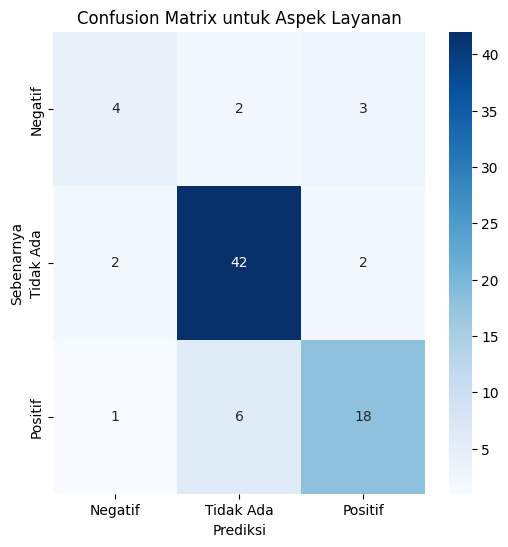

In [27]:
# Prediksi menggunakan data uji
y_pred_layanan = model1.predict(X_test_layanan)

# Menampilkan classification report dengan zero_division=1 untuk menghindari warning
print(f"Classification Report untuk aspek Layanan:\n")
print(classification_report(y_test_layanan, y_pred_layanan, zero_division=1))  # Menambahkan zero_division=1

# Hitung confusion matrix
cm = confusion_matrix(y_test_layanan, y_pred_layanan)

# Visualisasi confusion matrix menggunakan seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negatif', 'Tidak Ada', 'Positif'], yticklabels=['Negatif', 'Tidak Ada', 'Positif'])
plt.title(f'Confusion Matrix untuk Aspek Layanan')
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.show()

In [28]:
# Konversi prediksi ke DataFrame
pred_df = pd.DataFrame({
    'Text': df['text'][y_test_layanan.index],  # Access original text using index of y_test_layanan
    'Actual': y_test_layanan,
    'Predicted': y_pred_layanan
})

# Tampilkan contoh data
display_with_scroll(pred_df, height='600px')

,Text,Actual,Predicted
198,Posisi sedang di pulau terpencil di papua. Ada sinyal telkomsel mentok 200kbps tapi pas pakek starling tembus 3mbps 😁,1,1
349,Tapi sayang bagi kaum konsumsi rumah pribadi kemahalan,0,0
33,Telk*m bakal hancur dengan kehadiran starlink,0,0
208,Operator Indonesia harus buat gebrakan kalau gak mau kalah dari Starlink. Kurangin biaya internet dan naikin speed internet misalnya.,0,1
93,Tetap aja fiber optik masih yg terbaik.. Ini cocok. Buat yg tidak tercover fiber optik,1,0
84,Bagus nee biar provider lain mikir2 buat nurunin harga paket dan Lemot 😅😅,0,0
374,ini mah keterlaluan udah mahal barang nya. pembayaran perbulanya aja mahal juga. beginilah kalau pembisnis.,0,0
94,Kurang cocok di IKN bila Sudah rimbun pohonnya 😄😄😄,-1,1
222,Untuk menjangkau pelosok yg internetnya masih susah ini bagus si,1,1
126,Bentar lagi para provider di indonesia bakal demo berjilid-jilid buat block starlink Semoga mereka berbenah diri buat internet jadi semakin cepat semakin murah. Semua orang bisa merasakan internet,-1,-1


## Aspek Kecepatan

Classification Report untuk aspek Kecepatan:

              precision    recall  f1-score   support

          -1       0.67      0.67      0.67         3
           0       0.90      0.97      0.94        67
           1       0.80      0.40      0.53        10

    accuracy                           0.89        80
   macro avg       0.79      0.68      0.71        80
weighted avg       0.88      0.89      0.87        80



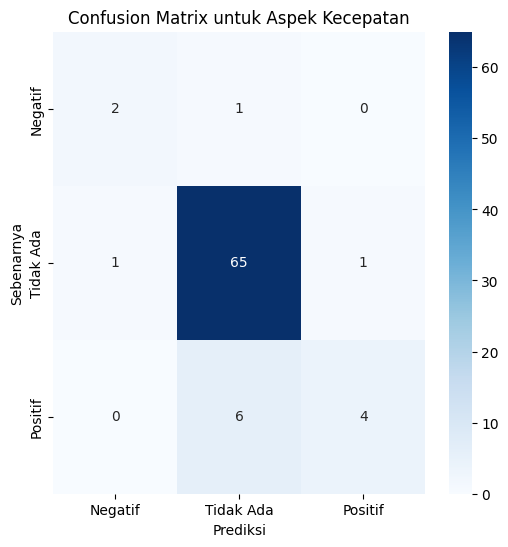

In [29]:
# Prediksi menggunakan data uji
y_pred_kecepatan = model2.predict(X_test_kecepatan)

# Menampilkan classification report dengan zero_division=1 untuk menghindari warning
print(f"Classification Report untuk aspek Kecepatan:\n")
print(classification_report(y_test_kecepatan, y_pred_kecepatan, zero_division=1))  # Menambahkan zero_division=1

# Hitung confusion matrix
cm = confusion_matrix(y_test_kecepatan, y_pred_kecepatan)

# Visualisasi confusion matrix menggunakan seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negatif', 'Tidak Ada', 'Positif'], yticklabels=['Negatif', 'Tidak Ada', 'Positif'])
plt.title(f'Confusion Matrix untuk Aspek Kecepatan')
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.show()

In [30]:
# Konversi prediksi ke DataFrame
pred_df = pd.DataFrame({
    'Text': df['text'][y_test_kecepatan.index],           # Teks asli
    'Actual': y_test_kecepatan,         # Label asli (jika tersedia)
    'Predicted': y_pred_kecepatan       # Hasil prediksi
})

# Tampilkan contoh data
display_with_scroll(pred_df, height='600px')

,Text,Actual,Predicted
198,Posisi sedang di pulau terpencil di papua. Ada sinyal telkomsel mentok 200kbps tapi pas pakek starling tembus 3mbps 😁,1,0
349,Tapi sayang bagi kaum konsumsi rumah pribadi kemahalan,0,0
33,Telk*m bakal hancur dengan kehadiran starlink,0,0
208,Operator Indonesia harus buat gebrakan kalau gak mau kalah dari Starlink. Kurangin biaya internet dan naikin speed internet misalnya.,-1,0
93,Tetap aja fiber optik masih yg terbaik.. Ini cocok. Buat yg tidak tercover fiber optik,0,0
84,Bagus nee biar provider lain mikir2 buat nurunin harga paket dan Lemot 😅😅,1,0
374,ini mah keterlaluan udah mahal barang nya. pembayaran perbulanya aja mahal juga. beginilah kalau pembisnis.,0,0
94,Kurang cocok di IKN bila Sudah rimbun pohonnya 😄😄😄,0,0
222,Untuk menjangkau pelosok yg internetnya masih susah ini bagus si,0,0
126,Bentar lagi para provider di indonesia bakal demo berjilid-jilid buat block starlink Semoga mereka berbenah diri buat internet jadi semakin cepat semakin murah. Semua orang bisa merasakan internet,0,0


## Aspek Harga

Classification Report untuk aspek Harga:

              precision    recall  f1-score   support

          -1       0.75      0.81      0.78        26
           0       0.93      0.90      0.92        42
           1       0.55      0.50      0.52        12

    accuracy                           0.81        80
   macro avg       0.74      0.74      0.74        80
weighted avg       0.81      0.81      0.81        80



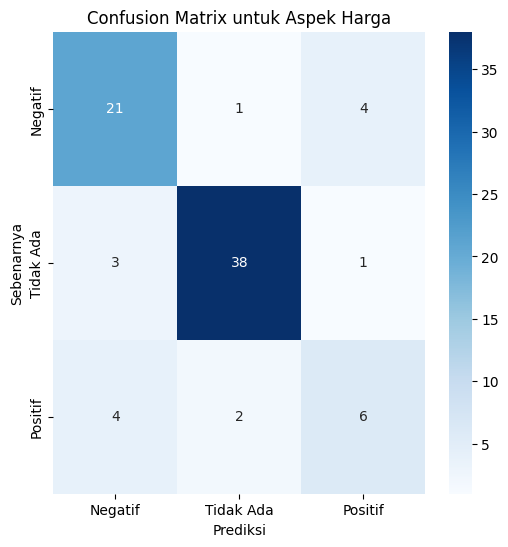

In [31]:
# Prediksi menggunakan data uji
y_pred_harga = model3.predict(X_test_harga)

# Menampilkan classification report dengan zero_division=1 untuk menghindari warning
print(f"Classification Report untuk aspek Harga:\n")
print(classification_report(y_test_harga, y_pred_harga, zero_division=1))  # Menambahkan zero_division=1

# Hitung confusion matrix
cm = confusion_matrix(y_test_harga, y_pred_harga)

# Visualisasi confusion matrix menggunakan seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negatif', 'Tidak Ada', 'Positif'], yticklabels=['Negatif', 'Tidak Ada', 'Positif'])
plt.title(f'Confusion Matrix untuk Aspek Harga')
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.show()

In [32]:
# Konversi prediksi ke DataFrame
pred_df = pd.DataFrame({
    'Text': df['text'][y_test_harga.index],           # Teks asli
    'Actual': y_test_harga,         # Label asli (jika tersedia)
    'Predicted': y_pred_harga       # Hasil prediksi
})

# Tampilkan contoh data
display_with_scroll(pred_df, height='600px')

,Text,Actual,Predicted
198,Posisi sedang di pulau terpencil di papua. Ada sinyal telkomsel mentok 200kbps tapi pas pakek starling tembus 3mbps 😁,0,0
349,Tapi sayang bagi kaum konsumsi rumah pribadi kemahalan,-1,-1
33,Telk*m bakal hancur dengan kehadiran starlink,0,0
208,Operator Indonesia harus buat gebrakan kalau gak mau kalah dari Starlink. Kurangin biaya internet dan naikin speed internet misalnya.,-1,1
93,Tetap aja fiber optik masih yg terbaik.. Ini cocok. Buat yg tidak tercover fiber optik,0,0
84,Bagus nee biar provider lain mikir2 buat nurunin harga paket dan Lemot 😅😅,1,1
374,ini mah keterlaluan udah mahal barang nya. pembayaran perbulanya aja mahal juga. beginilah kalau pembisnis.,-1,-1
94,Kurang cocok di IKN bila Sudah rimbun pohonnya 😄😄😄,0,0
222,Untuk menjangkau pelosok yg internetnya masih susah ini bagus si,0,0
126,Bentar lagi para provider di indonesia bakal demo berjilid-jilid buat block starlink Semoga mereka berbenah diri buat internet jadi semakin cepat semakin murah. Semua orang bisa merasakan internet,-1,1


In [33]:
from sklearn.metrics import accuracy_score
accuracy_model1 = accuracy_score(y_test_layanan, y_pred_layanan)
accuracy_model2 = accuracy_score(y_test_kecepatan, y_pred_kecepatan)
accuracy_model3 = accuracy_score(y_test_harga, y_pred_harga)

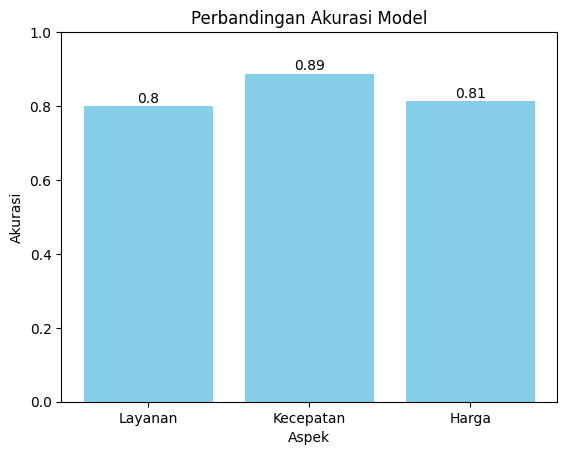

In [37]:
import matplotlib.pyplot as plt

model_names = ["Layanan", "Kecepatan", "Harga"]
accuracy = [accuracy_model1, accuracy_model2, accuracy_model3]

plt.bar(model_names, accuracy, color=['skyblue'])

plt.xlabel("Aspek")
plt.ylabel("Akurasi")
plt.title("Perbandingan Akurasi Model")
plt.ylim(0, 1)

# Menampilkan nilai di atas batang
for i, v in enumerate(accuracy):
    plt.text(i, v + 0.01, str(round(v, 2)), ha='center')

plt.show()


Berdasarkan hasil prediksi analisis sentimen menggunakan SVM pada Starlink Elon Musk, diperoleh perbandingan akurasi model pada tiga aspek utama:

1. Layanan: Akurasi sebesar 80%, menunjukkan bahwa model cukup baik dalam mengklasifikasikan sentimen terkait layanan Starlink, meskipun masih ada ruang untuk perbaikan.
2. Kecepatan: Akurasi mencapai 89%, yang merupakan performa tertinggi di antara ketiga aspek, menandakan bahwa model lebih akurat dalam menganalisis sentimen terkait kecepatan internet Starlink.
3. Harga: Akurasi sebesar 81%, sedikit lebih tinggi dari layanan tetapi masih lebih rendah dibandingkan kecepatan, menunjukkan bahwa model cukup mampu menangkap sentimen terkait harga Starlink.

Kesimpulan:
*   Model SVM menunjukkan akurasi terbaik pada aspek kecepatan (89%), yang mungkin karena opini publik terhadap kecepatan internet Starlink lebih jelas dan konsisten.
*   Akurasi pada layanan dan harga masih di sekitar 80%, menandakan ada beberapa kesalahan klasifikasi yang mungkin disebabkan oleh opini yang lebih beragam atau ambigu pada aspek tersebut.
*   Secara keseluruhan, SVM cukup efektif dalam menganalisis sentimen
terkait Starlink, tetapi model masih bisa ditingkatkan dengan fine-tuning parameter atau menggunakan teknik lain seperti ensemble learning untuk meningkatkan akurasi.



